# Business Understanding

There are large number of cars at the used car dealership. We aim to identify the most important factors that drive the price of a used car and is sought after by consumers in a used car

## Exploratory Data Analysis

In [3]:
#Imports for data analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
import warnings

warnings.filterwarnings("ignore")

In [186]:
data = pd.read_csv('/data/vehicles.csv')
data.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


See a lot of NaNs. Lets understand the fields in the DF and its contents

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [7]:
data.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


There are some very high price cars. Lets check what those are

In [9]:
data[data['price'] > 520000].sort_values(by='price', ascending=True)


,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
208617,7315966576,saginaw-midland-baycity,554900,2019.0,NaN,f250 xlt crewcab,excellent,8 cylinders,gas,25365.0,lien,automatic,NaN,4wd,NaN,pickup,white,mi
149860,7313726518,bloomington,566567,2006.0,chrysler,300,NaN,NaN,gas,130000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,in
79088,7313479931,fort collins / north CO,655000,2010.0,chrysler,town & country,good,6 cylinders,gas,106000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,co
307671,7308585322,texoma,777777,2012.0,gmc,sierra,NaN,NaN,gas,144000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ok
307513,7316966675,texoma,777777,2012.0,gmc,sierra,NaN,NaN,gas,144000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,ok
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37410,7314052904,modesto,3009548743,2021.0,chevrolet,NaN,NaN,8 cylinders,gas,1000.0,clean,automatic,NaN,4wd,NaN,NaN,NaN,ca
91576,7309730903,delaware,3024942282,2000.0,mercedes-benz,benz e320,NaN,NaN,gas,100000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,de
257840,7309735768,south jersey,3024942282,2000.0,mercedes-benz,benz s430,NaN,NaN,gas,100000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,nj
318592,7308056031,eugene,3736928711,2007.0,toyota,tundra,excellent,8 cylinders,gas,164000.0,clean,automatic,NaN,4wd,full-size,pickup,silver,or


There are some records with really high price. After checking the dataset, anything more than $520000 looks like data errors. These would have to be removed from the dataset

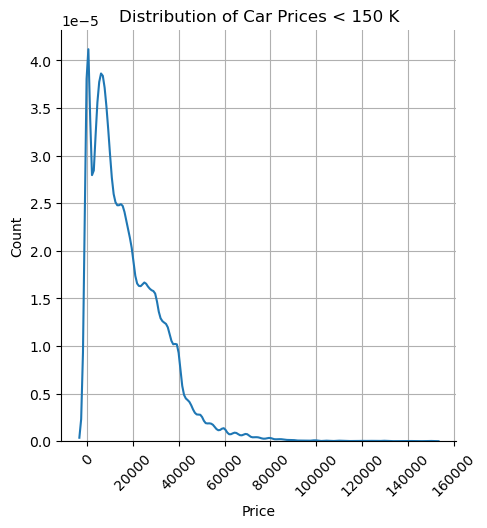

In [216]:
# plt.figure(figsize=(15, 6))
disp = sns.displot(data[data['price'] <= 150000], x='price', kind='kde', legend=True)
plt.title('Distribution of Car Prices < 150 K')
plt.xlabel('Price')
plt.xticks(rotation=45)
plt.ylabel('Count')
plt.grid()
plt.show()

The data is heavily skewed towards cars that have lower prices. There seems to be a spike at 0. We have to investigate that

In [13]:
data[data['price'] == 0]

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
10,7218893038,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
11,7218325704,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
12,7217788283,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
13,7217147606,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
14,7209027818,el paso,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tx
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426764,7303347225,wyoming,0,2018.0,NaN,peterbilt 579,NaN,NaN,diesel,1.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,wy
426812,7302877815,wyoming,0,2006.0,toyota,scion tc,excellent,4 cylinders,gas,195000.0,clean,automatic,JTKDE177460109655,fwd,NaN,NaN,silver,wy
426832,7302353283,wyoming,0,2004.0,toyota,prius,excellent,4 cylinders,hybrid,239000.0,clean,automatic,JTDKB20U840108051,fwd,NaN,NaN,blue,wy
426836,7302301268,wyoming,0,2018.0,ram,2500,excellent,6 cylinders,diesel,20492.0,clean,automatic,3C6UR5HL3JG307217,4wd,full-size,truck,white,wy


All these zero price cars would have to be dropped as the data appears to have not been populated properly for these

In [15]:
#Lets understand the data spread in each column
data_zip = zip(data.columns, data.isnull().sum(), data.nunique(), (data.isnull().sum()/data.shape[0])*100)
data_df = pd.DataFrame(data_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_df

,Column Name,Null Count,Unique Count,Null %
0,id,0,426880,0.000000
1,region,0,404,0.000000
2,price,0,15655,0.000000
3,year,1205,114,0.282281
4,manufacturer,17646,42,4.133714
5,model,5277,29649,1.236179
6,condition,174104,6,40.785232
7,cylinders,177678,8,41.622470
8,fuel,3013,5,0.705819
9,odometer,4400,104870,1.030735


Text(0, 0.5, 'Unique Count(log)')

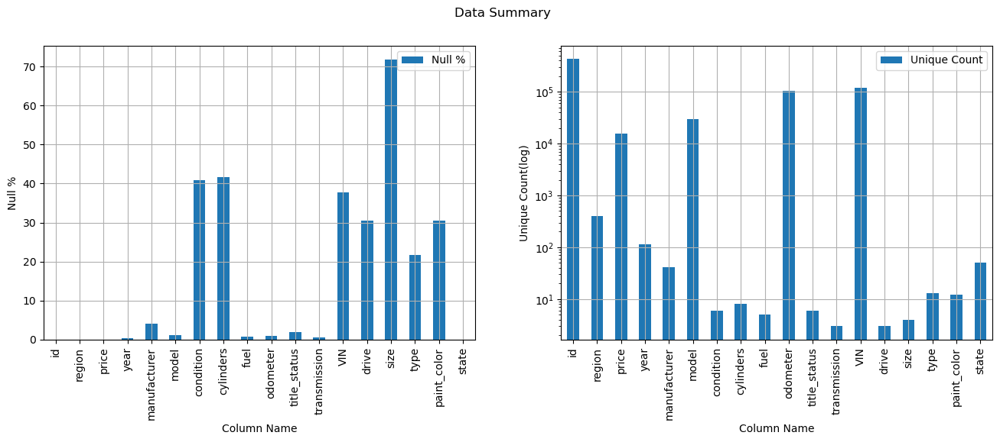

In [309]:
#Graphs that show these values for each column name
fig, ax = plt.subplots(1, 2, figsize = (16, 5))
fig.suptitle('Data Summary')
data_df.plot(x='Column Name', y='Null %', kind='bar', ax=ax[0])
data_df.plot(x='Column Name', y='Unique Count', kind='bar', ax=ax[1], logy = True)
ax[0].grid()
ax[1].grid()
ax[0].set_ylabel('Null %')
ax[1].set_ylabel('Unique Count(log)')

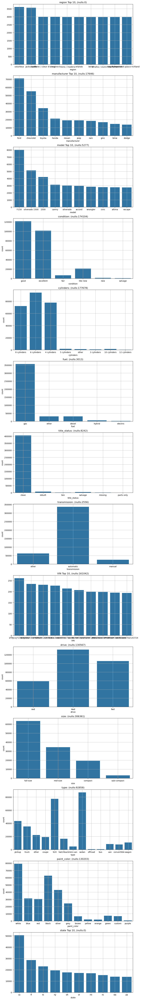

In [337]:
#Lets understand the data spread within the categorical fields
fig, ax = plt.subplots(nrows= (len(data.select_dtypes(include = 'object').columns)), ncols=1, figsize=(10, 70))
i = 0
for col in data.select_dtypes(include = 'object').columns:
#Only top 10 for the ones with large number of categories
  if col in ['state', 'region', 'VIN', 'model', 'manufacturer']:
   chart_data = data[col].value_counts().head(10)
   sns.barplot(x = chart_data.index, y = chart_data.values, ax=ax[i])
   ax[i].set_title(col + ' Top 10, ' + '(nulls:' +  str(data[col].isnull().sum()) +')')
  else:
    sns.countplot(x=data[col], ax=ax[i])
    ax[i].set_title(col + ': (nulls:' +  str(data[col].isnull().sum()) +')')
  ax[i].grid()
  i = i+1

plt.tight_layout()
plt.show()

Interesting to note that the same VIN showed up multiple times sometimes. Would not have expected that - not 200 times. 'title_status' is predominantly one value. Hence, everything other than clean can be bucketed into a 'not clean' group

In [19]:
#Show all records where we have the same VIN repeated more than 10 times
vins = data['VIN'].value_counts()[data['VIN'].value_counts() > 10]
#now, fetch all records in data where VIN is part of this list
data[data['VIN'].isin(vins.index)].sort_values(by='VIN', ascending = False)
#get the VINS, unique count of price and unique count of odometer values
data[data['VIN'].isin(vins.index)].groupby('VIN')[['price', 'odometer']].nunique().sort_values(by='price', ascending=False)
#Identify the list of VINs where there are no changes across multiple transactions. They should be dropped 
vins = data[data['VIN'].isin(vins.index)].groupby('VIN')[['price', 'odometer']].nunique()
vins['sum'] = vins['price'] + vins['odometer']
vins.sort_values(by='sum', ascending=False)
print(vins[vins['sum'] < 4].sort_values(by='sum', ascending = False))
vins_drop = vins[vins['sum'] < 4].index

                   price  odometer  sum
VIN                                    
JTHHE5BC8F5005501      2         1    3
1FT7W2BT1FEC79096      2         1    3
1FT7W2BT0FEB16732      2         1    3
4JGDF7CE3DA133699      2         1    3
4JGDF7DEXHA811076      2         1    3
...                  ...       ...  ...
1GTN1TEX0BZ109969      1         1    2
ZHWUF5ZF8MLA17048      1         1    2
5B4KPD27X83433783      1         0    1
1F65F5KY4E0A16474      1         0    1
7275856000             1         0    1

[2473 rows x 3 columns]


Fields that have small amount of Nulls :
* year
* model
* fuel
* title_status
* transmission

Lets see how they stack up


In [21]:
data_small_null = data[['year', 'model', 'fuel','title_status', 'transmission', 'odometer']]
#How many rows where at least 2 are null
data_small_null.isnull().sum(axis=1).value_counts()

0    405594
1     19375
2      1182
4       563
3        98
6        68
Name: count, dtype: int64

checking the same without title_status column. We could treat missing title_status as a separte status in itself

In [23]:
data_small_null = data[['year', 'model', 'fuel', 'transmission','odometer']]
#How many rows where at least 2 are null
data_small_null.isnull().sum(axis=1).value_counts()

0    412372
1     13334
3       565
2       541
5        68
Name: count, dtype: int64

Even if we drop all thse rows that have nulls in these columns, we would loose ~13K records, which is very small compared to the total colume of data. Hence, during data clensing, we will drop all the fields that have null in these three columns

In [25]:
#Check how missing manufacturer data can be processed
data[data['manufacturer'].isnull()]

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426843,7302129327,wyoming,21999,2017.0,NaN,2017,NaN,NaN,gas,51000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,wy
426846,7302118268,wyoming,41999,2015.0,NaN,2015,NaN,NaN,gas,126000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,wy
426862,7301950980,wyoming,27590,2018.0,NaN,Genesis G80 3.8 Sedan 4D,good,6 cylinders,gas,36138.0,clean,other,KMHGN4JE4JU248193,NaN,NaN,sedan,black,wy
426863,7301949724,wyoming,25590,2017.0,NaN,Genesis G80 3.8 Sedan 4D,good,6 cylinders,gas,37608.0,clean,automatic,KMHGN4JE2HU183838,rwd,NaN,sedan,white,wy


There are many records here that have everything but the state and region as NaN. These should be removed. For others, the first word within the model is the name of the manufacturer

## Data Cleanising

1. Drop ID
2. Drop all rows that have null in >
  > - year
  > - model
  > - fuel
  > - transmission
  > - odometer
  > - price
3. For mising manufacturer values, first lookup using 'model' and if that is empty, use the the first word from within the model
4. Replace null values in title_status with 'missing'
5. Convert 'cylinders' to a numeric column
6. Replace with default (Copy the most common value for the same manufacturer/model/year/combination, then manufacturer/model and then manufacturer alone) for >
  > - drive
  > - size
  > - type
  > - paint_color
  > - condition
  > - cylinder
7. Remove VINs from the previously identified drop_vin list. Further, as VIN does not give any material data, replace it with a "Yes/No" column
8. Delete rows that have more than 10 NaN values in it
9. There are some prices which are extremely large. Removing those
10. for title_status, group it into two groups - clean / not_clean


In [29]:
data_clense = data.copy()
data_clense.drop(columns=['id'], inplace=True)
data_clense.dropna(subset=['year', 'model', 'fuel', 'transmission','odometer','price'], inplace=True)
data_clense = data_clense[~data_clense['VIN'].isin(vins_drop)]

fillna_values = {'title_status': 'missing', 'VIN':'No', 'condition':'good'}
data_clense.fillna(value=fillna_values, inplace=True)
data_clense['VIN'] = data_clense['VIN'].apply(lambda x: 'Yes' if x != 'No' else 'No')
data_clense['title_status'] = data_clense['title_status'].apply(lambda x: 'clean' if x == 'clean' else 'not_clean')

#remove the word cylinder cylinder column and convert it to numeric
data_clense['cylinders'] = data_clense['cylinders'].str.replace('cylinders', '').str.strip()
#convert cylinders to numeric
data_clense['cylinders'] = pd.to_numeric(data_clense['cylinders'], errors='coerce')

#delete if price = 0
data_clense = data_clense[data_clense['price'] > 0]

#you can find manufacturer from model
manuf = data_clense.groupby('model')['manufacturer'].first().to_dict()
data_clense.fillna(value={'manufacturer': data_clense['model'].map(manuf)}, inplace = True)
#For the rest of manufacturers, take the first word from the model if it contains any of the values within the unique list of models
data_clense.fillna(value={'manufacturer': data_clense['model'].str.split().str[0].where(data_clense['model'].str.split().str[0].isin(data_clense['manufacturer'].unique()))}, inplace=True)
#Drop the rest of the null manufacturers. We dont have enought time to deal with the rest
data_clense.dropna(subset=['manufacturer'], inplace=True)

#remove rows with large number of NaN
data_clense.dropna(thresh=10, inplace=True)
data_clense = data_clense[data_clense['price'] <= 520000]

#Check Data position
data_clense_zip = zip(data_clense.columns, data_clense.isnull().sum(), data_clense.nunique(), (data_clense.isnull().sum()/data_clense.shape[0])*100)
data_clense_df = pd.DataFrame(data_clense_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_clense_df

,Column Name,Null Count,Unique Count,Null %
0,region,0,404,0.000000
1,price,0,15068,0.000000
2,year,0,107,0.000000
3,manufacturer,0,41,0.000000
4,model,0,21510,0.000000
5,condition,0,6,0.000000
6,cylinders,121820,7,39.022109
7,fuel,0,5,0.000000
8,odometer,0,93974,0.000000
9,title_status,0,2,0.000000


In [30]:
#Fix Data
key_cols = ['manufacturer', 'model', 'year']
col_to_process = ['drive', 'size', 'type', 'paint_color', 'condition', 'cylinders']
most_common_values = data_clense.groupby(key_cols)[col_to_process].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

In [31]:
data_clense_merge = pd.merge(data_clense, most_common_values, on=key_cols, how='left', suffixes=('', '_avg'))

for col in col_to_process:
  data_clense_merge.fillna(value={col : data_clense_merge[col+'_avg']}, inplace=True)

drop_cols = [col+'_avg' for col in col_to_process]
data_clense_merge.drop(columns=drop_cols, inplace=True)
data_clense_merge.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,auburn,15000,2013.0,ford,f-150 xlt,excellent,6.0,gas,128000.0,clean,automatic,No,rwd,full-size,truck,black,al
1,auburn,35000,2019.0,toyota,tacoma,excellent,6.0,gas,43000.0,clean,automatic,No,4wd,compact,truck,grey,al
2,auburn,4500,1992.0,jeep,cherokee,excellent,6.0,gas,192000.0,clean,automatic,No,4wd,full-size,SUV,green,al
3,auburn,38990,2020.0,ford,f150 supercrew cab xlt,good,6.0,gas,12231.0,clean,other,Yes,4wd,NaN,pickup,silver,al
4,auburn,19900,2004.0,ford,f250 super duty,good,8.0,diesel,88000.0,clean,automatic,No,4wd,full-size,pickup,blue,al


In [32]:
#Check Data position
data_clense_merge_zip = zip(data_clense_merge.columns, data_clense_merge.isnull().sum(), data_clense_merge.nunique(), (data_clense_merge.isnull().sum()/data_clense_merge.shape[0])*100)
data_clense_merge_df = pd.DataFrame(data_clense_merge_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_clense_merge_df

,Column Name,Null Count,Unique Count,Null %
0,region,0,404,0.000000
1,price,0,15068,0.000000
2,year,0,107,0.000000
3,manufacturer,0,41,0.000000
4,model,0,21510,0.000000
5,condition,0,6,0.000000
6,cylinders,29828,7,9.554683
7,fuel,0,5,0.000000
8,odometer,0,93974,0.000000
9,title_status,0,2,0.000000


In [33]:
#there are still many null values. iterate dropping year and finding the mode of manufacturer and model
key_cols_2 = ['manufacturer', 'model']
most_common_values_2 = data_clense_merge.groupby(key_cols_2)[col_to_process].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

In [34]:
most_common_values_2

0                                           drive       size   type  \
manufacturer model                                                    
acura        2002 rsx type s                  fwd        NaN  coupe   
             3.0cl                            fwd    compact  coupe   
             3.2 cl type s                    fwd  full-size  coupe   
             3.2 tl                           fwd  full-size  sedan   
             3.2 tl - sport                   rwd  full-size  sedan   
...                                           ...        ...    ...   
volvo        xc90 t8 inscription              4wd   mid-size    SUV   
             xc90 t8 inscription 1300 miles   4wd        NaN    SUV   
             xc90 v8                          4wd  full-size    SUV   
             xc90 v8 awd                      4wd   mid-size    SUV   
             xc90 v8 awdsuv                   4wd        NaN    SUV   

0                                           paint_color  condition  cylinders  
manufacturer model                                                             
acura        2002 rsx type s                      black       good        4.0  
             3.0cl                                  red       fair        6.0  
             3.2 cl type s                         grey  excellent        6.0  
             3.2 tl                               white  excellent        6.0  
             3.2 tl - sport                         red  excellent        6.0  
...                                                 ...        ...        ...  
volvo        xc90 t8 inscription                   grey  excellent        6.0  
             xc90 t8 inscription 1300 miles         NaN  excellent        NaN  
             xc90 v8                              black       good        8.0  
             xc90 v8 awd                          white       good        8.0  
             xc90 v8 awdsuv                         NaN       good        8.0  

[21913 rows x 6 columns]

In [35]:
data_clense_merge_2 = pd.merge(data_clense_merge, most_common_values_2, on=key_cols_2, how='left', suffixes=('', '_avg'))

for col in col_to_process:
  data_clense_merge_2.fillna(value={col: data_clense_merge_2[col+'_avg']}, inplace=True)

drop_cols = [col+'_avg' for col in col_to_process]
data_clense_merge_2.drop(columns=drop_cols, inplace=True)
data_clense_merge_2.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,auburn,15000,2013.0,ford,f-150 xlt,excellent,6.0,gas,128000.0,clean,automatic,No,rwd,full-size,truck,black,al
1,auburn,35000,2019.0,toyota,tacoma,excellent,6.0,gas,43000.0,clean,automatic,No,4wd,compact,truck,grey,al
2,auburn,4500,1992.0,jeep,cherokee,excellent,6.0,gas,192000.0,clean,automatic,No,4wd,full-size,SUV,green,al
3,auburn,38990,2020.0,ford,f150 supercrew cab xlt,good,6.0,gas,12231.0,clean,other,Yes,4wd,full-size,pickup,silver,al
4,auburn,19900,2004.0,ford,f250 super duty,good,8.0,diesel,88000.0,clean,automatic,No,4wd,full-size,pickup,blue,al


In [36]:
#Check Data position
data_clense_merge_zip = zip(data_clense_merge_2.columns, data_clense_merge_2.isnull().sum(), data_clense_merge_2.nunique(), (data_clense_merge_2.isnull().sum()/data_clense_merge_2.shape[0])*100)
data_clense_merge_df = pd.DataFrame(data_clense_merge_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_clense_merge_df

,Column Name,Null Count,Unique Count,Null %
0,region,0,404,0.000000
1,price,0,15068,0.000000
2,year,0,107,0.000000
3,manufacturer,0,41,0.000000
4,model,0,21510,0.000000
5,condition,0,6,0.000000
6,cylinders,17927,7,5.742484
7,fuel,0,5,0.000000
8,odometer,0,93974,0.000000
9,title_status,0,2,0.000000


In [37]:
#there are still many nulls. So, we need to drop the year and see if we are able to gind better numbers
key_cols_3 = ['manufacturer']
most_common_values_3 = data_clense_merge.groupby(key_cols_3)[col_to_process].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

In [38]:
data_clense_merge_3 = pd.merge(data_clense_merge_2, most_common_values_3, on=key_cols_3, how='left', suffixes=('', '_avg'))

for col in col_to_process:
  data_clense_merge_3.fillna(value ={col: data_clense_merge_3[col+'_avg']}, inplace=True)

drop_cols = [col+'_avg' for col in col_to_process]
data_clense_merge_3.drop(columns=drop_cols, inplace=True)
data_clense_merge_3.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,auburn,15000,2013.0,ford,f-150 xlt,excellent,6.0,gas,128000.0,clean,automatic,No,rwd,full-size,truck,black,al
1,auburn,35000,2019.0,toyota,tacoma,excellent,6.0,gas,43000.0,clean,automatic,No,4wd,compact,truck,grey,al
2,auburn,4500,1992.0,jeep,cherokee,excellent,6.0,gas,192000.0,clean,automatic,No,4wd,full-size,SUV,green,al
3,auburn,38990,2020.0,ford,f150 supercrew cab xlt,good,6.0,gas,12231.0,clean,other,Yes,4wd,full-size,pickup,silver,al
4,auburn,19900,2004.0,ford,f250 super duty,good,8.0,diesel,88000.0,clean,automatic,No,4wd,full-size,pickup,blue,al


In [39]:
#Check Data position
data_clense_merge_zip = zip(data_clense_merge_3.columns, data_clense_merge_3.isnull().sum(), data_clense_merge_3.nunique(), (data_clense_merge_3.isnull().sum()/data_clense_merge_3.shape[0])*100)
data_clense_merge_df = pd.DataFrame(data_clense_merge_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_clense_merge_df

,Column Name,Null Count,Unique Count,Null %
0,region,0,404,0.0
1,price,0,15068,0.0
2,year,0,107,0.0
3,manufacturer,0,41,0.0
4,model,0,21510,0.0
5,condition,0,6,0.0
6,cylinders,0,7,0.0
7,fuel,0,5,0.0
8,odometer,0,93974,0.0
9,title_status,0,2,0.0


In [40]:
#for the rest, let us default with the mode of the column so there are no issues
data_clense_merge_3.fillna(data_clense_merge_3.mode().iloc[0], inplace=True)

In [41]:
#Final Data position
data_clense_merge_zip = zip(data_clense_merge_3.columns, data_clense_merge_3.isnull().sum(), data_clense_merge_3.nunique(), (data_clense_merge_3.isnull().sum()/data_clense_merge_3.shape[0])*100)
data_clense_merge_df = pd.DataFrame(data_clense_merge_zip, columns=['Column Name', 'Null Count', 'Unique Count', 'Null %'])
data_clense_merge_df

,Column Name,Null Count,Unique Count,Null %
0,region,0,404,0.0
1,price,0,15068,0.0
2,year,0,107,0.0
3,manufacturer,0,41,0.0
4,model,0,21510,0.0
5,condition,0,6,0.0
6,cylinders,0,7,0.0
7,fuel,0,5,0.0
8,odometer,0,93974,0.0
9,title_status,0,2,0.0


As we have very limited numerical columns, we will perform correlation checks after the data is encoded to numerical values

In [43]:
#there are way too many manufacturers and models. Lets us see how the stack up
data_clense_merge_3['manufacturer'].value_counts()

manufacturer
ford               54912
chevrolet          41843
toyota             26801
honda              18202
nissan             15574
jeep               14842
ram                12147
gmc                11901
dodge              10814
bmw                10585
mercedes-benz       8645
hyundai             8286
subaru              8215
volkswagen          7118
kia                 6739
lexus               6128
cadillac            5453
audi                5144
chrysler            5079
buick               4159
mazda               4145
acura               3671
infiniti            3126
lincoln             2816
volvo               2464
mitsubishi          2177
pontiac             2114
mini                1837
rover               1494
mercury             1085
porsche             1061
saturn              1008
jaguar               985
fiat                 564
tesla                404
alfa-romeo           369
harley-davidson      112
datsun                68
ferrari               63
aston-martin

In [44]:
data_clense_merge_3['model'].value_counts()

model
f-150                       6528
silverado 1500              4085
1500                        3443
camry                       2668
accord                      2650
                            ... 
3 s sport                      1
3500 cargo van ext             1
f-250 flat bed                 1
3500 series dually truck       1
gand wagoneer                  1
Name: count, Length: 21510, dtype: int64

In [45]:
#There are 25K+ models in the list. They cannot be feature engineered / cleansed in the available time. Hence, we will drop this column
data_clense_merge_3.drop(columns=['model'], inplace=True)
#We also know that region and state are strongly co-rrelated. Lets remove that also to reduce the load on the system
data_clense_merge_3.drop(columns=['region'], inplace=True)

Text(0, 0.5, 'Unique Count (log)')

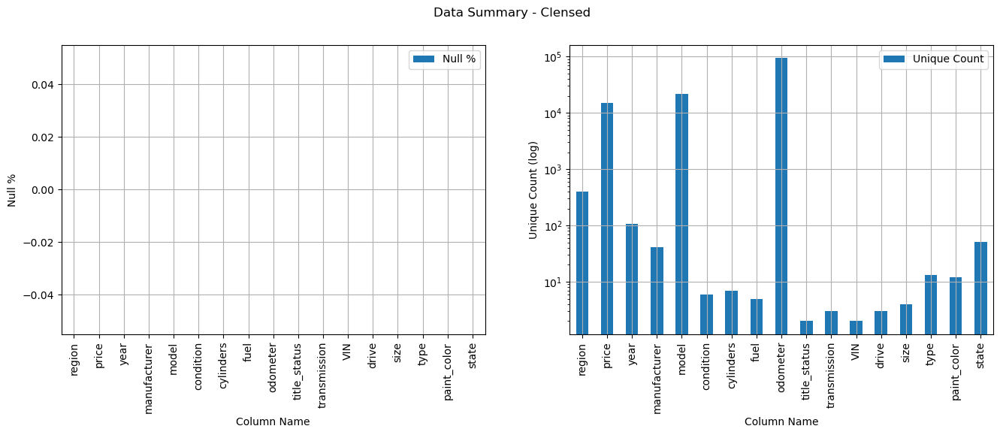

In [46]:
#Final data position after cleansing
fig, ax = plt.subplots(1, 2, figsize = (16, 5))
fig.suptitle('Data Summary - Clensed')
data_clense_merge_df.plot(x='Column Name', y='Null %', kind='bar', ax=ax[0])
data_clense_merge_df.plot(x='Column Name', y='Unique Count', kind='bar', ax=ax[1], logy = True)
ax[0].grid()
ax[1].grid()
ax[0].set_ylabel('Null %')
ax[1].set_ylabel('Unique Count (log)')

In [47]:
vehicle_data = data_clense_merge_3.copy()
del data_clense_merge_2
del data_clense_merge_df
del data_clense_merge_zip
del data_clense_merge
del data

## Modeling

We will treat this as a regression problem to track the price of a car and identify the features that are the most important

Lets get the Features going  next

In [59]:
#Split to Test and Train
X = vehicle_data.drop(columns=['price'])
y = vehicle_data['price']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42, shuffle=True)

In [60]:
#Lets one hot encode the nominal columns and convert ordinal data to numeric features
transformers = [
    ('oe1', OrdinalEncoder(categories=[['fwd','rwd', '4wd']]), ['drive']),
    ('oe2', OrdinalEncoder(categories=[['sub-compact','compact','mid-size','full-size',]]), ['size']),
    ('oe3', OrdinalEncoder(categories=[['salvage','fair','good', 'like new', 'excellent', 'new' ]]), ['condition']),
    ('poly', PolynomialFeatures(include_bias=False), ['year', 'odometer', 'cylinders']),
    ('ohe', OneHotEncoder(drop='if_binary', sparse_output=False), ['manufacturer', 'fuel', 'transmission', 'paint_color', 'state', 'type', 'VIN', 'title_status' ]) ]

oe_ohe_transform = ColumnTransformer(
    transformers,
    remainder='passthrough'
)

In [61]:
#Lets get a baseline with Linear Regression
pipe = Pipeline([
                   ('oe_ohe_transform', oe_ohe_transform),
                   ('scaler', StandardScaler()),
                   ('linreg', LinearRegression()) 
])

pipe.fit(X_train, y_train)
rmse_baseline_train = mean_squared_error(pipe.predict(X_train), y_train) ** 0.5
r2_baseline_train = r2_score(pipe.predict(X_train), y_train)
rmse_baseline_test = mean_squared_error(pipe.predict(X_test),y_test) ** 0.5
r2_baseline_test = r2_score(pipe.predict(X_test), y_test)

print(f'Baseline Train: RMSE = {rmse_baseline_train:.4f}, R2 = {r2_baseline_train:.4f}')
print(f'Baseline Test: RMSE = {rmse_baseline_test:.4f}, R2 = {r2_baseline_test:.4f}')

Baseline Train: RMSE = 9217.1418, R2 = 0.3347
Baseline Test: RMSE = 9235.2744, R2 = 0.3226


In [62]:
#Now, let us check VIF on the columns
def vif(exogs, data):
  vif_dict = {} #doing this to convert this to a DF later
  for exog in exogs:
    not_exog = [i for i in exogs if i != exog]
    Xv,yv = data[not_exog], data[exog]
    lrv = LinearRegression()
    r_sq = lrv.fit(Xv,yv).score(Xv,yv) #score gives default metric - in this case MSA
    vif = 1/(1-r_sq)
    vif_dict[exog] = vif

  return pd.DataFrame({'VIF':vif_dict})

In [63]:
vif_calc_df = X_train.select_dtypes(include=['float64']).copy()
exogs = vif_calc_df.columns

#VIF
vif_df = vif(exogs, vif_calc_df)
vif_df.sort_values(by = 'VIF', ascending = False)


,VIF
year,1.067712
cylinders,1.045747
odometer,1.024039


VIF of these numerical fields is below 5. Hence, they are all good to go!

<Axes: title={'center': 'Correlation between numerical fields'}>

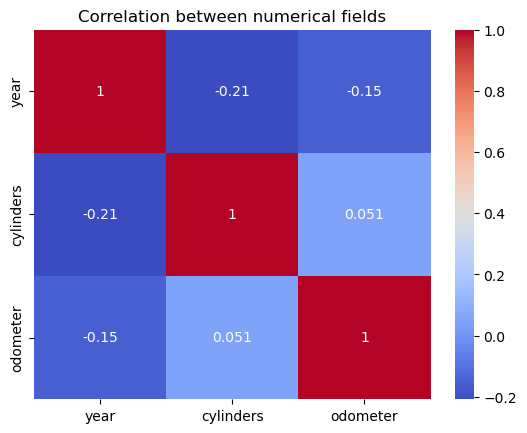

In [65]:
#Just to be sure, adding a corelation matrix
plt.title('Correlation between numerical fields')
sns.heatmap(vif_calc_df.corr(), annot=True, cmap= 'coolwarm')

Shows no correlation at all. Continuing on with model generation

In [67]:
#Lets try 3 models

# Initialize models
models = {
    'Linear Regression': Pipeline([('transform', oe_ohe_transform), ('scale', StandardScaler()), ('model', LinearRegression())]),
    'Ridge Regression': Pipeline([('transform', oe_ohe_transform), ('scale', StandardScaler()),('model', Ridge(alpha = 1, fit_intercept=False))]),
    'Lasso Regression': Pipeline([('transform', oe_ohe_transform), ('scale', MinMaxScaler()),('model', Lasso(max_iter=15000))])
}

In [68]:
#Lets check the performance on the default models 
for name, model in models.items():
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(pred, y_test))
    r2 = r2_score(pred, y_test)
    print(f'{name}: RMSE = {rmse:.4f}, R2 = {r2:.4f}')

Linear Regression: RMSE = 9235.2744, R2 = 0.3226
Ridge Regression: RMSE = 19262.9098, R2 = -2.1207
Lasso Regression: RMSE = 10152.9000, R2 = 0.0055


Let us use this as a baseline and run some gridsearches to find a more optimum model

In [146]:
param_grid = {
    'Ridge Regression': {'model__alpha': [0.01, 0.1, 1.0, 10.0], 'transform__poly__degree':[1,2,3]},
    'Lasso Regression': {'model__alpha': [0.1,1,2], 'transform__poly__degree':[1,2,3]},
}

#Tuning using GridSearch
best_models = {}
for name, model in models.items():
    if name in param_grid:
        grid = GridSearchCV(model, param_grid[name], cv=5, scoring='neg_mean_squared_error')
        grid.fit(X_train, y_train)
        best_models[name] = grid.best_estimator_
        best_rmse = np.sqrt(-grid.best_score_)
        print(f"Best {name}: {grid.best_params_}, RMSE = {best_rmse:.4f}")

print()

print('Evaluate only the best models on Test')
results = {}
for name, model in best_models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = mse ** 0.5
    r2 = r2_score(y_test, y_pred)
    results[name] = {'RMSE': rmse, 'R2': r2}
    print(f'Test : {name}: RMSE = {rmse:.4f}, R2 = {r2:.4f}')

Best Ridge Regression: {'model__alpha': 0.01, 'transform__poly__degree': 3}, RMSE = 19127.3551
Best Lasso Regression: {'model__alpha': 0.1, 'transform__poly__degree': 3}, RMSE = 9099.6546

Evaluate only the best models on Test
Test : Ridge Regression: RMSE = 19117.3712, R2 = -0.7302
Test : Lasso Regression: RMSE = 9085.7835, R2 = 0.6092


Based on this, the best option seems to be the Lasso with alpha 1 and 2nd degree polinomial as it has RMSE very close to the default Linear regression, and  a higher R2 score

In [148]:
pipe_final = best_models['Lasso Regression']

In [149]:
#Permutation importance - Identify which features are the most important in this model
pir = permutation_importance(pipe_final, X_test, y_test, random_state=42 )

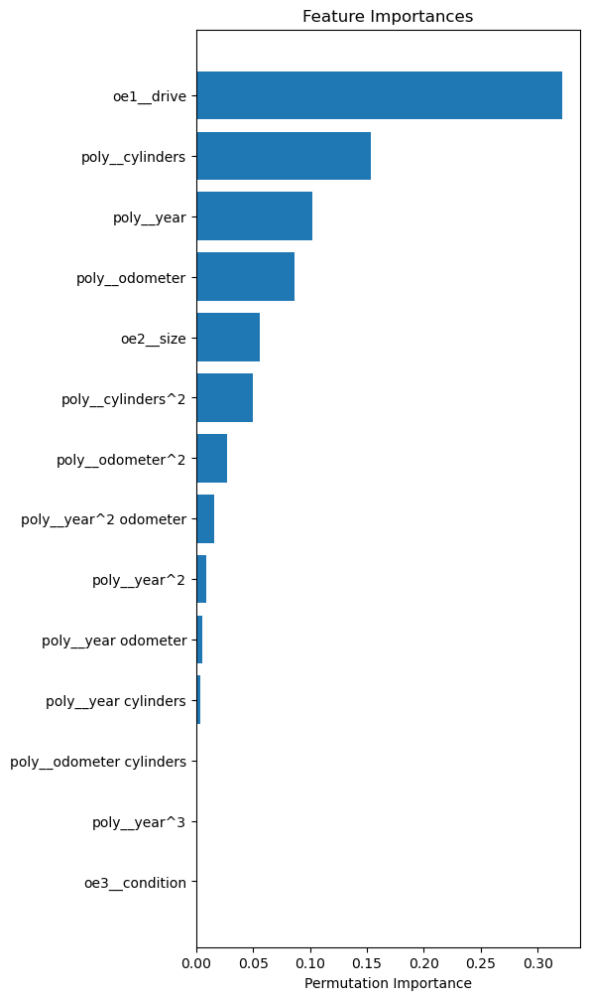

In [172]:
# Data from the permutation importance calculation
features = pipe_final.named_steps['transform'].get_feature_names_out()
# features = [x.split('__')[1] for x in features]
importances = pir.importances_mean

# Sort features by importance
sorted_idx = np.argsort(importances)

# Plot the bar graph
axes = plt.barh(range(len(sorted_idx)), importances[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), features[sorted_idx])
plt.xlabel('Permutation Importance')
plt.title('Feature Importances')
plt.show()

Trace how the test predictions are tracking the actual values 

Text(0.5, 1.0, 'Lasso Coefficient Values')

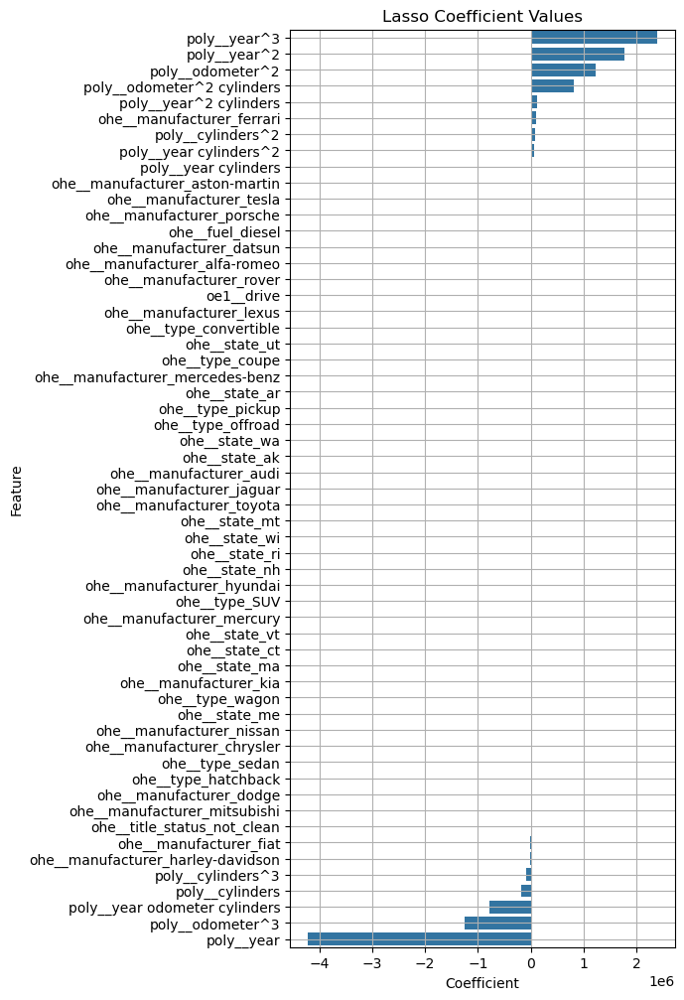

In [162]:
coefficients = pipe_final.named_steps['model'].coef_
coefficients_df = pd.DataFrame({'Feature': features, 'Coefficient': coefficients})
coefficients_df.sort_values(by='Coefficient', ascending=True)
plt.rcParams['figure.figsize'] = [5, 12]
coefficients_df_filter = coefficients_df[abs(coefficients_df['Coefficient']) > 2000]
sns.barplot(data=coefficients_df_filter.sort_values(by='Coefficient', ascending=False), x='Coefficient', y='Feature')
plt.grid()
plt.title('Lasso Coefficient Values')

In [153]:
#List of coefficients
coefficients_df

,Feature,Coefficient
0,oe1__drive,3.792567e+03
1,oe2__size,1.231417e+03
2,oe3__condition,-7.438694e+01
3,poly__year,-4.222649e+06
4,poly__odometer,0.000000e+00
...,...,...
144,ohe__type_truck,1.581505e+03
145,ohe__type_van,-0.000000e+00
146,ohe__type_wagon,-2.556427e+03
147,ohe__VIN_Yes,1.299770e+03


In [154]:
y_pred = pipe_final.predict(X_test)
results_df = pd.DataFrame({'Actual':y_test, 'Predicted':np.round(y_pred,2)})
results_df['error'] = np.abs(results_df['Actual'] - results_df['Predicted'])
results_df.sample(20)

,Actual,Predicted,error
8507,7800,7273.00,527.00
243994,4000,3534.58,465.42
140101,4299,5855.51,1556.51
175662,19990,24800.56,4810.56
148590,6900,14035.26,7135.26
247926,8780,6079.56,2700.44
233137,46990,30076.55,16913.45
303618,36984,26655.55,10328.45
224315,8800,17803.79,9003.79
149966,27399,23586.95,3812.05


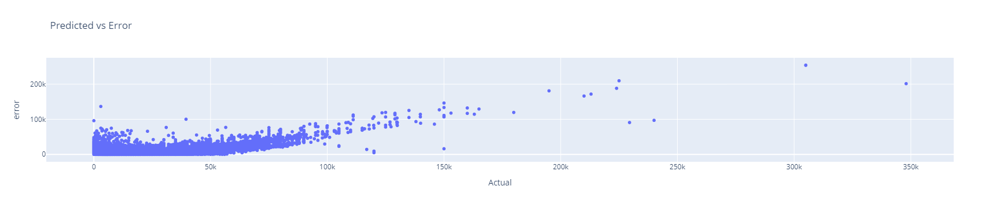

In [155]:
fig = px.scatter(results_df, x='Actual', y='error', title='Predicted vs Error')
fig.show()

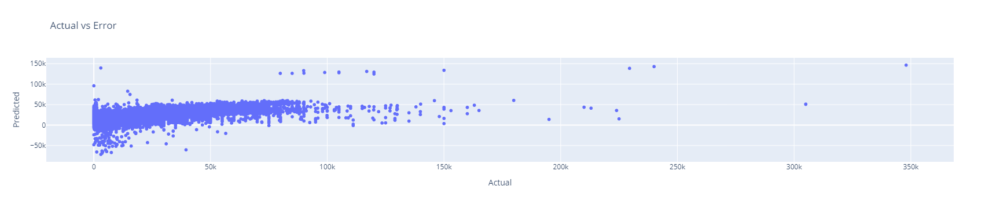

In [156]:
fig = px.scatter(results_df, x='Actual', y='Predicted', title='Actual vs Error')
fig.show()

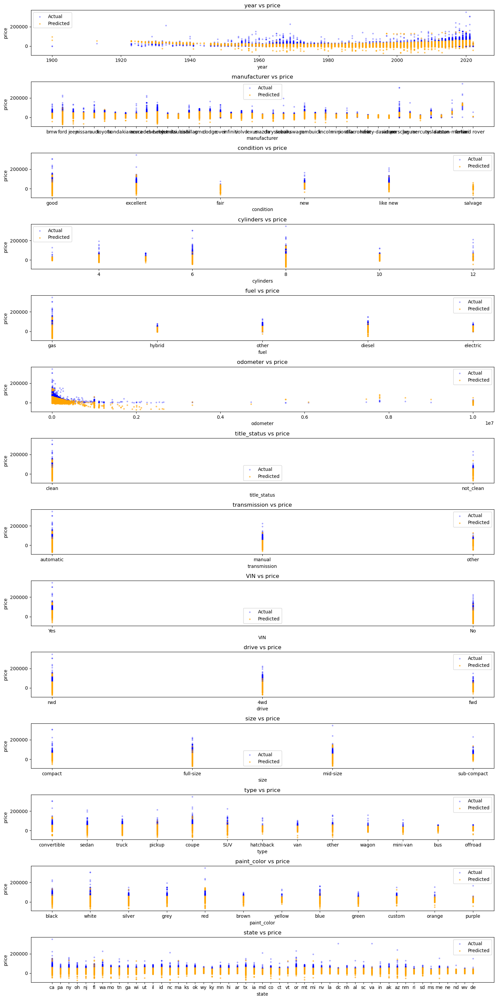

In [263]:
# Create scatter plots for each selected feature against the target variable
plt.figure(figsize=(15, 30))
for i, feature in enumerate(X_test.columns, 1):
    plt.subplot(len(X_test.columns), 1, i)
    plt.scatter(X_test[feature], y_test, color='blue', label='Actual', s=6, alpha = 0.25)
    plt.scatter(X_test[feature], y_pred, color='orange', label='Predicted', s=6, alpha = 0.5)
    plt.xlabel(f'{feature}')
    plt.ylabel('price')
    plt.title(f'{feature} vs price')
    plt.legend()

plt.tight_layout()
plt.show()

# Final comments
 - The inference from the model seems by and large in line with real world
 - There is a definite opportunity to further finetune this model to reduce prediction errors [especially in the lowest and highest quartiles]
 - Some of the predictions show negative results. They have to be investigated further

## Findings
- The top 5 features that drive the price of a used car in this model are -
   - Type of 'drive'
   - Number of 'cylinders'
   - 'year' of manufacturing,
   - The amount of miles on the 'odometer'
   - 'size' of car
- Some of the the other interesting results identified by the model are :
   - 'manufacturer' Ferrari, Aston-Martin, Porsche and Tesla command a premium 
   - Diesel 'fuel' vehicles command a premium
   - 'manufacturer' fiat performs the worst and not having a clean title moves the pricing needle in the wrong direction!

## Predict

In [299]:
#Predict using this new model.
#input - Ensure that VIN is replaced as YES/NO and title_status is updated to clean / not_clean
data_predict = pd.read_csv('C:/data/pa2/test_file.csv')

In [301]:
data_predict

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,long island,2022,nissan,rogue,excellent,4,gas,30000,clean,automatic,Yes,4wd,mid-size,SUV,red,ny
1,vermont,2000,ford,taurus,fair,6,diesel,3000,not_clean,automatic,Yes,fwd,full-size,sedan,black,vt
2,albuquerque,2013,bmw,x1 xdrive35i,excellent,6,gas,82000,clean,automatic,No,4wd,mid-size,SUV,black,nm
3,eugene,2019,ford,fiesta titanium hatchback,like new,4,gas,50836,not_clean,automatic,No,fwd,compact,hatchback,black,or
4,bay area,2020,mitsubishi,mirage es hatchback,good,4,gas,1152,clean,manual,Yes,fwd,compact,hatchback,red,ga


In [303]:
# Run this data through the model to get the predicted output values
predictions = pipe_final.predict(data_predict)

In [305]:
predictions

array([24003.54300961, 15489.53960373, 20236.55574462, 11384.25466435,
       20514.64235165])

In [307]:
# The predicted_price column has the new prices
output = data_predict.copy()
output['predicted_price'] = predictions
output.head()

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state,predicted_price
0,long island,2022,nissan,rogue,excellent,4,gas,30000,clean,automatic,Yes,4wd,mid-size,SUV,red,ny,24003.543010
1,vermont,2000,ford,taurus,fair,6,diesel,3000,not_clean,automatic,Yes,fwd,full-size,sedan,black,vt,15489.539604
2,albuquerque,2013,bmw,x1 xdrive35i,excellent,6,gas,82000,clean,automatic,No,4wd,mid-size,SUV,black,nm,20236.555745
3,eugene,2019,ford,fiesta titanium hatchback,like new,4,gas,50836,not_clean,automatic,No,fwd,compact,hatchback,black,or,11384.254664
4,bay area,2020,mitsubishi,mirage es hatchback,good,4,gas,1152,clean,manual,Yes,fwd,compact,hatchback,red,ga,20514.642352
